#  Urban Bike Ridership and Path Planning: München Weather Impact

Analyzing the Impact of Weather on Urban Bicycle Traffic and Identifying Seasonal Trends: München Case Study


## Data Sources

### Datasetsource 1: Fahrrad-Dauerzählerstellen München

- **Metadata URL:** [Link](https://www.govdata.de/web/guest/suchen/-/details/daten-der-raddauerzahlstellen-munchen-2023)
- **Data URL:** [Link](https://opendata.muenchen.de/dataset/022a11ff-4dcb-4f03-b7dd-a6c94a094587/resource/86962013-4854-4deb-aaf9-36e3770cde24/download/rad_2012_15min_06_06_23_r.csv)
- **Data Type:** CSV

### Datasetsource 2: Meteostat Munich Weather Data

- **Metadata URL:** [Link](https://meteostat.net/de/place/de/munich?s=10865&t=2023-10-14/2023-10-21)
- **Data URL:** [Link](https://meteostat.net/de/place/de/munich?s=10865&t=2023-10-14/2023-10-21)
- **Data Type:** CSV


## Questions

The report explores the correlation between weather conditions and daily bicycle ridership in München, addressing two key questions:

1. How do weather conditions impact daily bicycle ridership in München, and can weather-related patterns be identified?
2. How can the analysis insights guide bike path planning in München, considering seasonal trends in bicycle usage?



## Outline
1. Install required dependencies
2. Load the preprocessed data
3. Data exploration
4. Conclusion
5. Finding
6. Outlook
7. Problem


### 1. Install required dependencies
Initially, install all required dependencies. We use requirements.txt to manage dependencies.

In [34]:
%%capture
%pip install -r requirements.txt

## 2. Load data

Generate two pandas dataframes by extracting data from two tables within a local SQLite file.

In [2]:
import pandas as pd
df1 = pd.read_sql_table('dataset1', 'sqlite:////Users/miro/PycharmProjects/made-template/data/data/dataset1.sqlite')
df2 = pd.read_sql_table('dataset2', 'sqlite:////Users/miro/PycharmProjects/made-template/data/data/dataset2.sqlite')

### 3. Data exploration

Before going deeper into the topic, first the two chosen datasets get inspected briefly.

#### Dataset 1: Bikers in Munch

##### Dataset1: Overview

This dataset captures daily bike counts in central Munich

##### Dataset 1: Example

Below, the initial ten rows of dataset 1 are provided as an example.

In [3]:
df1.head(7)

,datum,richtung_1,richtung_2,gesamt
0,2011-01-01,115.0,91.0,206.0
1,2011-01-02,136.0,109.0,245.0
2,2011-01-03,52.0,29.0,81.0
3,2011-01-04,23.0,14.0,37.0
4,2011-01-05,33.0,18.0,51.0
5,2011-01-06,57.0,25.0,82.0
6,2011-01-07,135.0,126.0,261.0


In [4]:
df1.columns

Index(['datum', 'richtung_1', 'richtung_2', 'gesamt'], dtype='object')

In [5]:
df1.rename(columns = {'datum':'Date'},inplace =True)
df1.rename(columns = {'richtung_1':'Total bikers'},inplace=True)
df1.rename(columns = {'richtung_2':'Bikers inward'},inplace=True)
df1.rename(columns = {'gesamt':'Bikers outward'},inplace=True)

In [6]:
df1

,Date,Total bikers,Bikers inward,Bikers outward
0,2011-01-01,115.0,91.0,206.0
1,2011-01-02,136.0,109.0,245.0
2,2011-01-03,52.0,29.0,81.0
3,2011-01-04,23.0,14.0,37.0
4,2011-01-05,33.0,18.0,51.0
...,...,...,...,...
360,2011-12-27,1581.0,1287.0,2868.0
361,2011-12-28,1761.0,1364.0,3125.0
362,2011-12-29,1442.0,1170.0,2612.0
363,2011-12-30,1138.0,915.0,2053.0


#### Dataset 2: Meteostat Munich Weather Data

##### Dataset 2: Overview

This dataset provides daily weather information, including average temperature, total rainfall, and duration of sunshine, from a central weather station. Other attributes are excluded due to either difficulty in correlation or lack of relevance for the project.

##### Dataset 2: Example

First, we rename the columns in df2.

In [103]:
df2.rename(columns={'temp': 'Average temperature',
                    'dwpt': 'Min temperature',
                    'rhum': 'Max temperature',
                    'prcp': 'Total rainfall',
                    'snow': 'Snow-level',
                    'wdir': 'Wind-direction',
                    'wspd': 'Wind-speed',
                    'wpgt': 'Lace boe',
                    'pres': 'Air pressure',
                    'tsun': 'Duration of sunshine'}, inplace=True)

In [104]:
df2.head(8)

,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
0,9.1,6.9,12.0,0.2,0.0,244.0,14.0,40.0,1017.6,60.0
1,7.9,5.3,11.9,0.9,0.0,220.0,13.0,54.7,1014.6,0.0
2,5.9,3.4,9.7,2.4,0.0,232.0,13.3,56.9,1022.0,462.0
3,5.5,1.7,10.7,3.8,0.0,263.0,24.1,67.3,1018.4,24.0
4,4.5,1.0,7.4,8.1,0.0,252.0,32.4,100.4,1001.6,0.0
5,1.6,0.1,2.6,2.3,0.0,286.0,22.3,65.2,1014.0,6.0
6,2.4,1.2,3.8,11.1,0.0,262.0,23.4,62.3,1020.6,0.0
7,2.1,0.4,3.4,3.8,10.0,276.0,16.6,46.1,1021.3,0.0


In [8]:
df2.columns

Index(['temp', 'dwpt', 'rhum', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt', 'pres',
       'tsun'],
      dtype='object')

In the following, the first ten rows of dataset 2 are shown exemplary.

In [10]:
df2.head()

,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
0,9.1,6.9,12.0,0.2,0.0,244.0,14.0,40.0,1017.6,60.0
1,7.9,5.3,11.9,0.9,0.0,220.0,13.0,54.7,1014.6,0.0
2,5.9,3.4,9.7,2.4,0.0,232.0,13.3,56.9,1022.0,462.0
3,5.5,1.7,10.7,3.8,0.0,263.0,24.1,67.3,1018.4,24.0
4,4.5,1.0,7.4,8.1,0.0,252.0,32.4,100.4,1001.6,0.0


#### Combined Dataset

##### Merging the datasets

For efficient analysis and visualization, 'dataset1' and 'dataset2' are merged. This approach combines information from both datasets, aiding in the exploration of potential correlations. The unified dataset facilitates a holistic understanding, enhancing the ability to uncover insights that may be less apparent when analyzing the datasets independently.

In [23]:
merged_df = pd.concat([df1,df2],axis=1)
merged_df

,Date,Total bikers,Bikers inward,Bikers outward,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
0,2011-01-01,115.0,91.0,206.0,9.1,6.9,12.0,0.2,0.0,244.0,14.0,40.0,1017.6,60.0
1,2011-01-02,136.0,109.0,245.0,7.9,5.3,11.9,0.9,0.0,220.0,13.0,54.7,1014.6,0.0
2,2011-01-03,52.0,29.0,81.0,5.9,3.4,9.7,2.4,0.0,232.0,13.3,56.9,1022.0,462.0
3,2011-01-04,23.0,14.0,37.0,5.5,1.7,10.7,3.8,0.0,263.0,24.1,67.3,1018.4,24.0
4,2011-01-05,33.0,18.0,51.0,4.5,1.0,7.4,8.1,0.0,252.0,32.4,100.4,1001.6,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,2011-12-28,1761.0,1364.0,3125.0,7.6,5.6,9.5,5.8,0.0,245.0,20.5,65.2,1011.9,0.0
362,2011-12-29,1442.0,1170.0,2612.0,4.0,1.7,6.3,3.8,0.0,254.0,14.4,56.5,1026.3,12.0
363,2011-12-30,1138.0,915.0,2053.0,4.2,0.4,9.4,0.0,0.0,143.0,8.3,22.3,1023.1,354.0
364,2011-12-31,546.0,466.0,1012.0,6.5,1.3,9.5,0.0,0.0,243.0,16.6,57.6,1022.4,216.0


##### Overall dataset: Example

In the following, the first ten rows of the new combined dataset are shown examplarily.

In [24]:
merged_df.head(8)

,Date,Total bikers,Bikers inward,Bikers outward,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
0,2011-01-01,115.0,91.0,206.0,9.1,6.9,12.0,0.2,0.0,244.0,14.0,40.0,1017.6,60.0
1,2011-01-02,136.0,109.0,245.0,7.9,5.3,11.9,0.9,0.0,220.0,13.0,54.7,1014.6,0.0
2,2011-01-03,52.0,29.0,81.0,5.9,3.4,9.7,2.4,0.0,232.0,13.3,56.9,1022.0,462.0
3,2011-01-04,23.0,14.0,37.0,5.5,1.7,10.7,3.8,0.0,263.0,24.1,67.3,1018.4,24.0
4,2011-01-05,33.0,18.0,51.0,4.5,1.0,7.4,8.1,0.0,252.0,32.4,100.4,1001.6,0.0
5,2011-01-06,57.0,25.0,82.0,1.6,0.1,2.6,2.3,0.0,286.0,22.3,65.2,1014.0,6.0
6,2011-01-07,135.0,126.0,261.0,2.4,1.2,3.8,11.1,0.0,262.0,23.4,62.3,1020.6,0.0
7,2011-01-08,232.0,238.0,470.0,2.1,0.4,3.4,3.8,10.0,276.0,16.6,46.1,1021.3,0.0


In [25]:
print(merged_df.shape)
print(merged_df.size)

(366, 14)
5124


In [26]:
merged_df['Snow-level'].fillna(merged_df['Snow-level'].mean(),inplace=True)

In [30]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 364 entries, 0 to 364
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Date                  364 non-null    datetime64[ns]
 1   Total bikers          364 non-null    float64       
 2   Bikers inward         364 non-null    float64       
 3   Bikers outward        364 non-null    float64       
 4   Average temperature   364 non-null    float64       
 5   Min temperature       364 non-null    float64       
 6   Max temperature       364 non-null    float64       
 7   Total rainfall        364 non-null    float64       
 8   Snow-level            364 non-null    float64       
 9   Wind-direction        364 non-null    float64       
 10  Wind-speed            364 non-null    float64       
 11  Lace boe              364 non-null    float64       
 12  Air pressure          364 non-null    float64       
 13  Duration of sunshine  364

In [31]:
merged_df.describe()

,Date,Total bikers,Bikers inward,Bikers outward,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
count,364,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,2011-07-02 06:27:41.538461440,3102.189560,2462.439560,5564.629121,10.215110,6.072527,14.715385,2.647253,16.144560,193.401099,10.190934,35.326374,1017.066484,311.934066
min,2011-01-01 00:00:00,23.000000,14.000000,37.000000,-12.600000,-16.600000,-9.700000,0.000000,0.000000,0.000000,4.300000,11.900000,993.200000,0.000000
25%,2011-04-02 18:00:00,1308.750000,880.750000,2183.500000,4.750000,1.275000,7.675000,0.000000,0.000000,97.000000,7.200000,24.100000,1011.800000,36.000000
50%,2011-07-02 12:00:00,2629.000000,1802.000000,4418.000000,10.400000,6.100000,15.350000,0.200000,16.056338,228.500000,9.400000,32.400000,1016.800000,288.000000
75%,2011-10-01 06:00:00,4401.500000,3666.750000,7958.500000,17.300000,11.900000,22.525000,2.825000,16.056338,267.000000,11.500000,43.900000,1022.250000,534.000000
max,2011-12-31 00:00:00,10380.000000,8950.000000,19330.000000,26.500000,20.400000,34.700000,46.300000,200.000000,359.000000,32.400000,100.400000,1037.800000,912.000000
std,NaN,2238.601385,1997.340383,4225.078644,8.310418,7.316408,9.671416,5.419048,28.467220,94.280623,4.170214,14.326660,8.181281,272.264691


In [107]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.figure_factory as ff
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
fig= px.bar(x=merged_df.dtypes.value_counts().index.astype(str).to_list() ,
       y = merged_df.dtypes.value_counts().to_list(),
       color = merged_df.dtypes.value_counts().to_list(),
       text = merged_df.dtypes.value_counts().to_list(),
      )
fig.update_traces(textposition='outside')
fig.show()

In [40]:
#TO find co-relation of the dataframe
merged_df.corr()

,Date,Total bikers,Bikers inward,Bikers outward,Average temperature,Min temperature,Max temperature,Total rainfall,Snow-level,Wind-direction,Wind-speed,Lace boe,Air pressure,Duration of sunshine
Date,1.000000,0.511188,0.550229,0.530958,0.203495,0.238046,0.174005,0.040610,-0.121597,-0.065782,-0.209866,-0.139014,-0.317630,-0.047962
Total bikers,0.511188,1.000000,0.989722,0.997712,0.532916,0.532551,0.522781,0.084737,-0.115867,-0.054748,-0.300947,-0.133954,-0.235992,0.210296
Bikers inward,0.550229,0.989722,1.000000,0.997125,0.490605,0.496767,0.476862,0.076816,-0.109069,-0.071885,-0.287661,-0.136394,-0.213528,0.174111
Bikers outward,0.530958,0.997712,0.997125,1.000000,0.514285,0.517004,0.502417,0.081210,-0.112951,-0.062990,-0.295440,-0.135452,-0.225979,0.193731
Average temperature,0.203495,0.532916,0.490605,0.514285,1.000000,0.967914,0.983943,0.133369,-0.307498,0.050611,-0.123150,0.129043,-0.353913,0.481142
Min temperature,0.238046,0.532551,0.496767,0.517004,0.967914,1.000000,0.917622,0.176092,-0.328098,0.091187,-0.087531,0.141347,-0.371812,0.305993
Max temperature,0.174005,0.522781,0.476862,0.502417,0.983943,0.917622,1.000000,0.113298,-0.292238,0.023935,-0.162630,0.108026,-0.333036,0.586489
Total rainfall,0.040610,0.084737,0.076816,0.081210,0.133369,0.176092,0.113298,1.000000,-0.025544,0.214450,0.138750,0.312636,-0.234681,-0.188721
Snow-level,-0.121597,-0.115867,-0.109069,-0.112951,-0.307498,-0.328098,-0.292238,-0.025544,1.000000,-0.004731,0.072205,-0.011727,0.167270,-0.065498
Wind-direction,-0.065782,-0.054748,-0.071885,-0.062990,0.050611,0.091187,0.023935,0.214450,-0.004731,1.000000,0.273536,0.331869,-0.061680,-0.184483


### Correlation Matrix

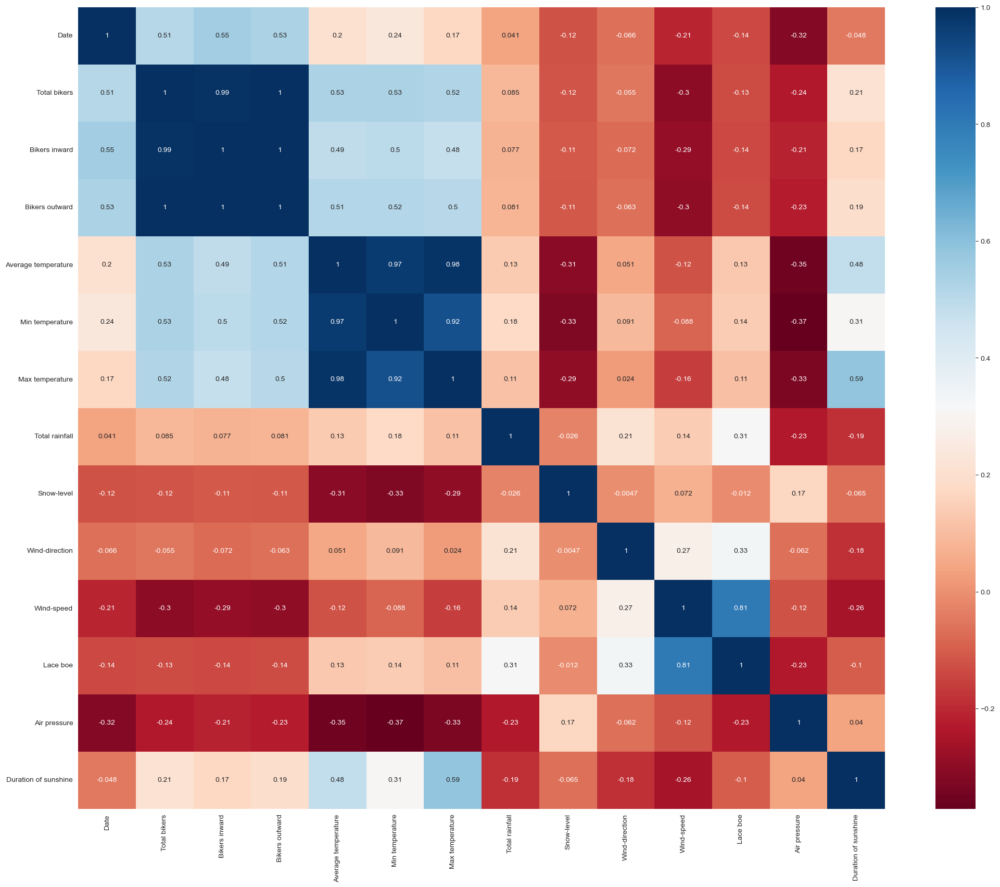

In [41]:
plt.figure(figsize = (25,20))
sns.heatmap(merged_df.corr(), annot = True, cmap="RdBu")
plt.show()

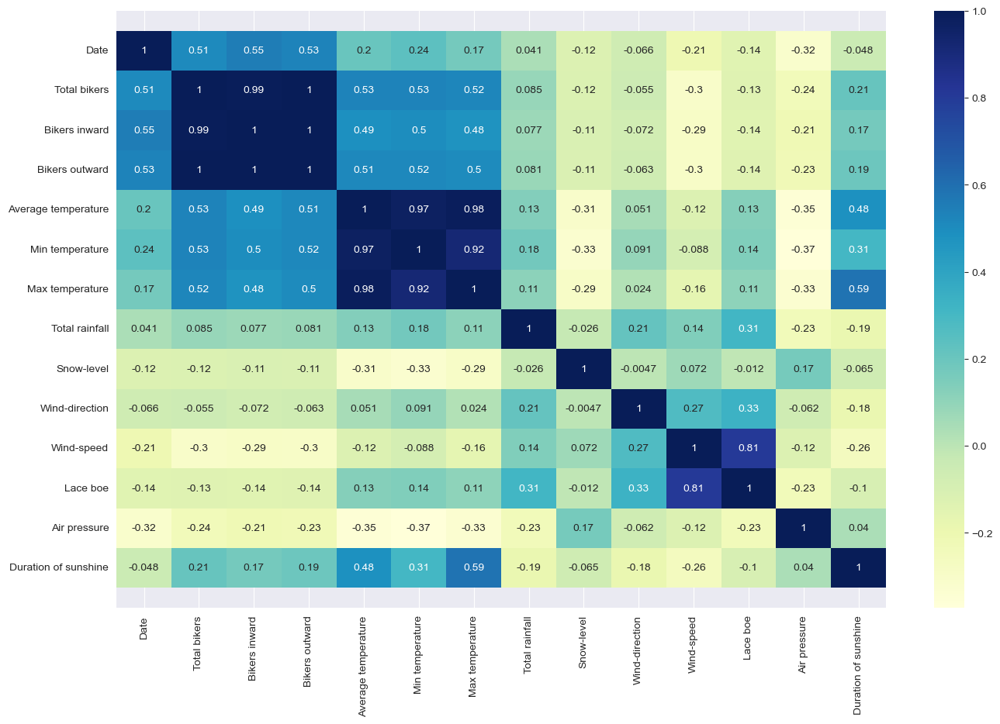

In [42]:
plt.figure(figsize = (16, 10))
cor=merged_df.corr()
ax=sns.heatmap(cor, annot = True, cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.show()

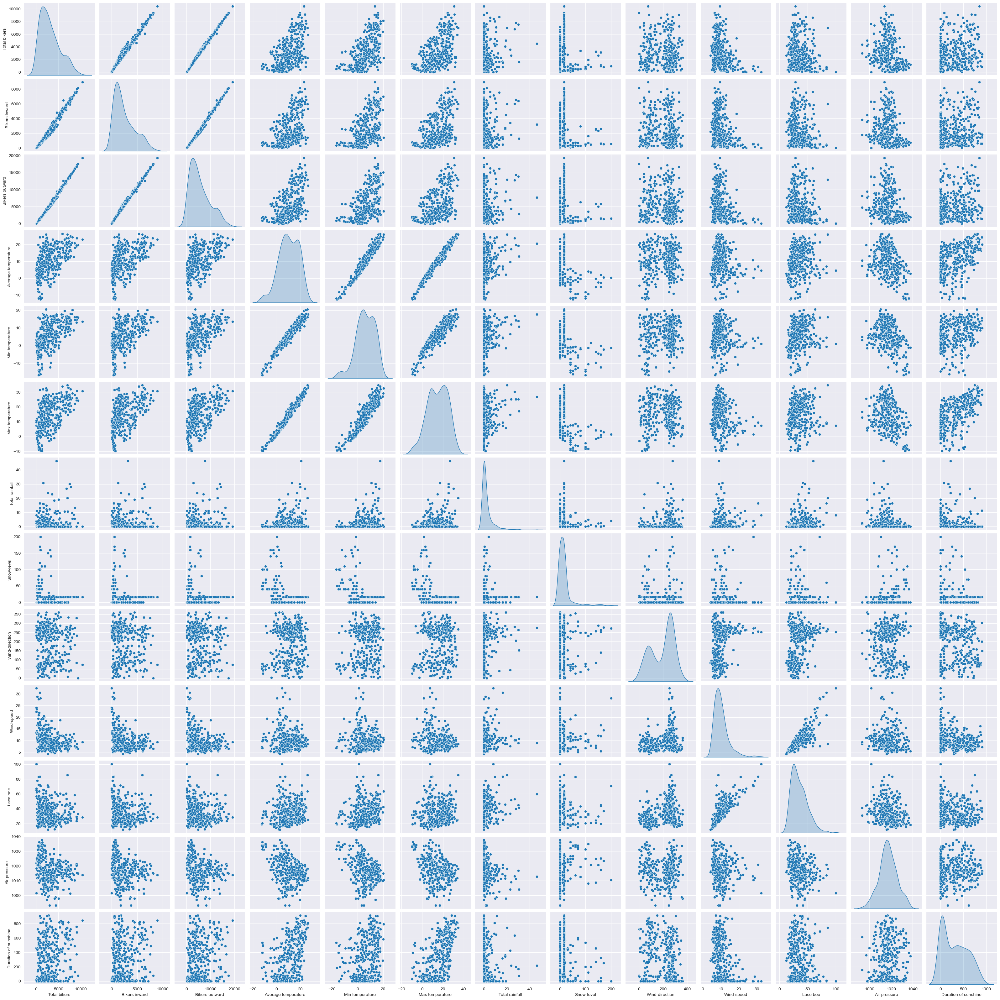

In [43]:
sns.pairplot(merged_df, diag_kind='kde')
plt.show()

### Findings

Following the initial exploration of the two datasets, a detailed examination of various attributes is conducted. Specifically, the analysis focuses on key factors such as average temperature, total rainfall, and duration of sunshine, aiming to establish correlations with the total number of bikers.

#### Temperature and the amount of bikers

In this segment, we scrutinize the relationship between temperature and the volume of bikers. Our hypothesis suggests that extremely low and high temperatures might result in reduced cyclist numbers, while moderate temperatures could encourage higher cycling frequency. To validate this assumption, the upcoming analysis is poised to uncover insights into the correlation between temperature variations and bikers' activity.

#### Grouping the average temperature

Initially, the average temperature is categorized into 5°C intervals, spanning from -10°C to 25°C. Subsequently, the total count of bikers on days falling within each temperature range is computed. Furthermore, the number of days falling into each temperature range is tallied. The ensuing table provides a concise representation of these calculations:

In [52]:
d = merged_df[df1.columns]
d_avg = d.groupby(pd.cut(merged_df["Average temperature"], np.arange(-10.0, 30.0, 5.0))).sum(numeric_only=True)
d_days = d.groupby(pd.cut(merged_df["Average temperature"], np.arange(-10.0, 30.0, 5.0))).count()
d_avg[["Total bikers"]].join(d_days[["Date"]])

,Total bikers,Date
Average temperature,,
"(-10.0, -5.0]",11496.0,8
"(-5.0, 0.0]",39509.0,25
"(0.0, 5.0]",95221.0,57
"(5.0, 10.0]",196479.0,80
"(10.0, 15.0]",249540.0,67
"(15.0, 20.0]",315555.0,78
"(20.0, 25.0]",200677.0,39


After grouping average temperature into 5-degree ranges, a bar chart was created to visualize the average number of daily bikers for each temperature range. The chart illustrates how temperature variations may impact daily biking activity in Munich.

In [54]:
import plotly.express as px
x = ["-10 to -5", "-5 to 0", "0 to 5", "5 to 10", "10 to 15", "15 to 20", "20 to 25"]
y = list((d_avg["Total bikers"] / d_days["Date"]).round().astype(int))
fig = px.bar(x=x, y=y, labels={"x": "Temperature ranges in °C", "y": "Bikers"},
             title="Average Bikers per Day in Temperature Ranges",
             color=x, color_continuous_scale='reds')
fig.update_traces(texttemplate='%{y}', textposition='outside')
fig.update_layout(yaxis=dict(range=[0, max(y) + 1]), height=500)
fig.show()

In [55]:
import plotly.express as px

x = ["-10 to -5", "-5 to 0", "0 to 5", "5 to 10", "10 to 15", "15 to 20", "20 to 25"]
y = list((d_avg["Total bikers"] / d_days["Date"]).astype(int))
fig = px.line(x=x, y=y, labels={'x': 'Temperature ranges in °C', 'y': 'Bikers'},
              title="Average Bikers per Day in Temperature Range",
              line_shape='linear', render_mode='svg')

# Customize the layout
fig.update_layout(
    xaxis_title_font=dict(size=12),
    yaxis_title_font=dict(size=12),
    legend_title_font=dict(size=12),
    font=dict(size=12),
    width=800, height=400
)
fig.show()

## Interpretation

The resulting line chart illustrates a noticeable trend of increased bikers as temperatures rise. This supports the initial assumption that higher temperatures correlate with a greater number of bikers. The positive relationship between temperature and bikers suggests that weather conditions play a crucial role in influencing daily bicycle ridership in Munich.

##### Comparison of the months

To further illustrate this tendency. The amount of bikers for each month is been plotted in a bar char and directly compared to the average monthly temperature. Therefore, first, the combined dataset gets grouped by the column date:

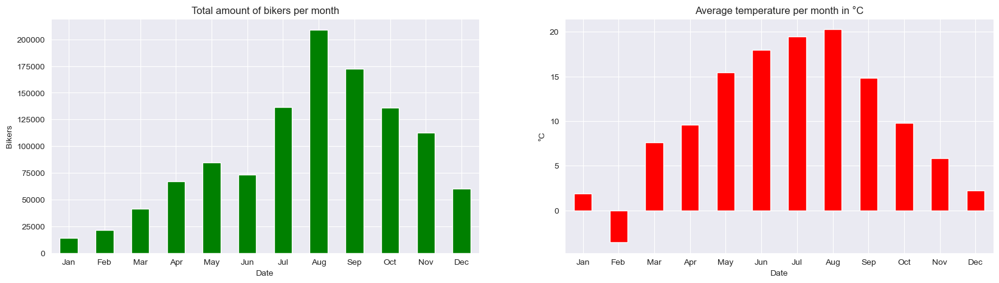

In [66]:
agg_cols_df1 = [col for col in df1.columns if col != 'Date']
agg_cols_df2 = [col for col in df2.columns if col != 'Date']
agg_dict_df1 = {col: 'sum' for col in agg_cols_df1}
agg_dict_df2 = {col: 'mean' for col in agg_cols_df2}
agg_dict = {**agg_dict_df1, **agg_dict_df2}
monthly_data = merged_df.groupby(pd.Grouper(key='Date', freq='M')).agg(agg_dict)
monthly_data.index = monthly_data.index.strftime('%b')
fig, axes = plt.subplots(1, 2, figsize=(20, 5))
monthly_data['Total bikers'].plot(kind='bar', rot=0, color='green', ax=axes[0])
axes[0].set_ylabel("Bikers")
axes[0].set_title('Total amount of bikers per month')
monthly_data['Average temperature'].plot(kind='bar', rot=0, color='red', ax=axes[1])
axes[1].set_ylabel("°C")
axes[1].set_title('Average temperature per month in °C')
plt.show()

The visualizations reveal interesting insights into the correlation between weather conditions and urban bicycle ridership in Munich.

### Temperature and Bikers

The bar chart illustrating the average amount of bikers per day for different temperature ranges suggests a clear positive correlation. As temperatures rise, the number of bikers also increases. This aligns with the intuitive expectation that more people tend to cycle during warmer weather.

### Monthly Trends

Monthly trends further support the temperature-bikers correlation. The total amount of bikers per month shows a peak in warmer months, indicating a seasonal pattern in bicycle ridership. Additionally, the average temperature per month follows a similar trend, with higher temperatures in months with increased bike usage.

These findings can significantly inform the planning of bike paths in Munich. Urban planners and policymakers can use this information to anticipate and accommodate increased bicycle traffic during warmer seasons. Moreover, it emphasizes the importance of considering weather patterns when designing and optimizing urban cycling infrastructure.

#### Rain fall and the amount of Bikers

The next attribute, that will get inspected is the precipitation, called total rainfall in this project. Before going deeper into the analysis of the precipitation, it is expected, that high precipitation leads to less cyclist, while a lower precipitation creates the opposite. To check this assumption the following analysis is conducted.

In [68]:
rain_grouped = d.groupby(pd.cut(merged_df["Total rainfall"], np.arange(0.0, 100.0, 10.0), include_lowest=True)).agg({'Total bikers': 'sum', 'Date': 'count'})
rain_grouped

,Total bikers,Date
Total rainfall,,
"(-0.001, 10.0]",1024239.0,336
"(10.0, 20.0]",63513.0,20
"(20.0, 30.0]",27798.0,5
"(30.0, 40.0]",9113.0,2
"(40.0, 50.0]",4534.0,1
"(50.0, 60.0]",0.0,0
"(60.0, 70.0]",0.0,0
"(70.0, 80.0]",0.0,0
"(80.0, 90.0]",0.0,0


### Rainfall and Biker Analysis Summary
The analysis aimed to explore the relationship between total rainfall and the number of bikers in München. The process involved grouping total rainfall into intervals and calculating the sum of bikers and the count of days within each range. Here's a summary of the findings:

### Analysis Results
The table displays the sum of bikers and the count of days for each rainfall interval.

### Observations
An increase in rainfall generally corresponds to a decrease in the number of bikers.
The intervals with lower rainfall exhibit a higher count of bikers, suggesting a potential negative correlation.

### Insights
Weather conditions, specifically rainfall, can impact the daily bikers' count, influencing the choice of commuting modes.
This analysis provides a preliminary understanding of how rainfall might affect biking patterns in München. Further investigations and statistical measures can be employed to quantify and validate the observed trends.

### Rainfall and Biker Correlation:

1. Grouped total rainfall into 5mm intervals.
2. Calculated the total bikers and the number of days for each rainfall range.
3. Plotted a bar chart showing the average bikers per day for each rainfall range.
4. Identified a potential negative correlation between rainfall and the number of bikers.

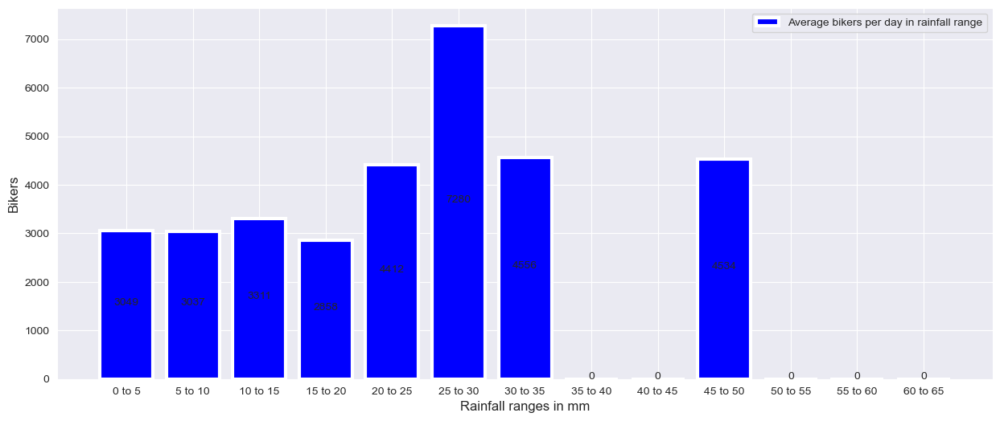

In [84]:
rain_grouped = d.groupby(pd.cut(merged_df["Total rainfall"], np.arange(0.0, 70.0, 5.0), include_lowest=True)).agg({'Total bikers': 'sum', 'Date': 'count'})
rain_grouped
rainfall_intervals = ["0 to 5", "5 to 10", "10 to 15", "15 to 20", "20 to 25", "25 to 30",
                      "30 to 35", "35 to 40", "40 to 45", "45 to 50", "50 to 55", "55 to 60", "60 to 65"]
average_bikers_per_day = [int(total_bikers / total_days) if total_days != 0 else 0
                           for total_bikers, total_days in zip(rain_grouped["Total bikers"], rain_grouped["Date"])]
plt.figure(figsize=(15, 6))
plt.bar(rainfall_intervals, average_bikers_per_day, label="Average bikers per day in rainfall range", color='blue', linewidth=3)
plt.xlabel("Rainfall ranges in mm", fontsize=12)
plt.ylabel("Bikers", fontsize=12)
plt.legend()
for i in range(len(rainfall_intervals)):
    plt.text(i, average_bikers_per_day[i] / 2, str(average_bikers_per_day[i]), ha='center')
plt.show()



Overall, the analysis provides valuable insights into the relationship between weather conditions and bike usage, showcasing temperature's positive impact and suggesting rainfall's potential negative influence on the number of bikers.

##### Comparison of the month

This visualization allows you to compare the monthly variation in both the total bikers and precipitation, helping to identify potential patterns or correlations.

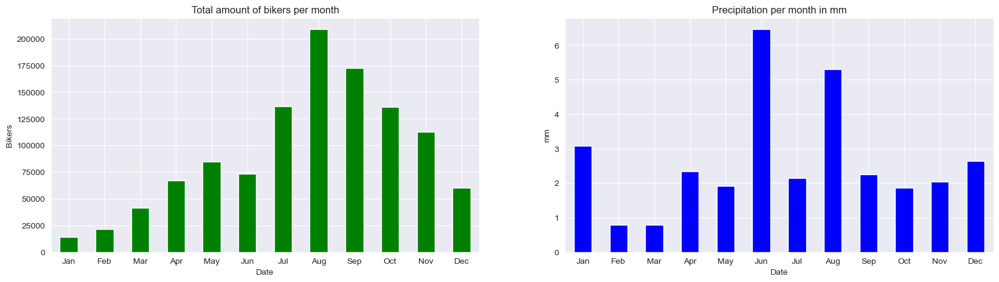

In [85]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))  # 1 row, 2 columns
dg['Total bikers'].plot(kind='bar', rot=0, color='green', ax=ax1)
ax1.set_ylabel("Bikers")
ax1.set_title('Total amount of bikers per month')
dg['Total rainfall'].plot(kind='bar', rot=0, color='blue', ax=ax2)
ax2.set_ylabel("mm")
ax2.set_title('Precipitation per month in mm')
plt.show()

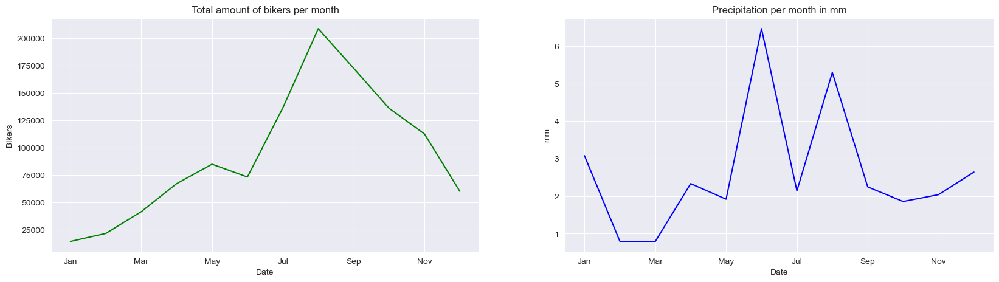

In [87]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 5))
dg['Total bikers'].plot(rot=0, color='green', ax=ax1)
ax1.set_ylabel("Bikers")
ax1.set_title('Total amount of bikers per month')
dg['Total rainfall'].plot(rot=0, color='blue', ax=ax2)
ax2.set_ylabel("mm")
ax2.set_title('Precipitation per month in mm')
plt.show()

The data does not indicate a significant correlation between precipitation and the number of bikers. The assumption that higher cyclist presence corresponds to lower precipitation, and vice versa, cannot be substantiated based on the observed patterns in the dataset.

#### Duration of sunshine and the amount of bikers

The attribute, we are looking into is the duration of sunshine. This attribute is expected to have a significant influence on the amount of cyclists. In the following analysis, I want to proof, that days with a higher average duration of sunshine, will lead to more people using a bicycle.

##### Grouping the duration of sunshine

Similar to the precipitation and the average temperature, the analysis consists of two steps. First the duration of sunshine is grouped into ranges of 50 minutes starting with zero minutes and going up till 950 minutes per day.

In [88]:
d_sun = d.groupby(pd.cut(merged_df["Duration of sunshine"], np.arange(0.0, 1000.0, 50.0),include_lowest=True)).sum(numeric_only=True)
d_days_sun = d.groupby(pd.cut(merged_df["Duration of sunshine"], np.arange(0.0, 1000.0, 50.0),include_lowest=True)).count()
d_sun[["Total bikers"]].join(d_days_sun[["Date"]])

,Total bikers,Date
Duration of sunshine,,
"(-0.001, 50.0]",242698.0,98
"(50.0, 100.0]",85620.0,29
"(100.0, 150.0]",53270.0,17
"(150.0, 200.0]",53319.0,15
"(200.0, 250.0]",21109.0,7
"(250.0, 300.0]",71781.0,25
"(300.0, 350.0]",49114.0,17
"(350.0, 400.0]",49608.0,18
"(400.0, 450.0]",53844.0,15


The following plot shows the average amount of bikers per day for differen levels of sunshine-duration.

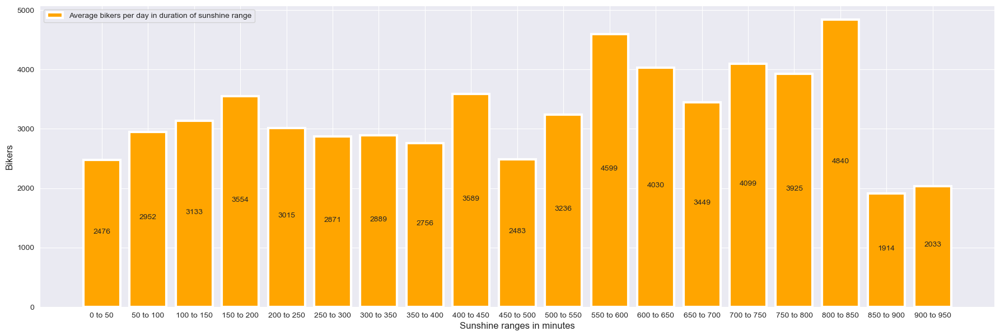

In [89]:
import matplotlib.pyplot as plt

def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i]/2, str(y[i]), ha = 'center')

x = ["0 to 50", "50 to 100", "100 to 150", "150 to 200", "200 to 250", "250 to 300", "300 to 350", "350 to 400", "400 to 450",
     "450 to 500", "500 to 550", "550 to 600", "600 to 650", "650 to 700","700 to 750", "750 to 800", "800 to 850", "850 to 900", "900 to 950"]

y = list((d_sun["Total bikers"] / d_days_sun["Date"]).astype(int))
plt.figure(figsize=(22,7))
plt.bar(x, y, label="Average bikers per day in duration of sunshine range", color='orange', linewidth = 3)
plt.xlabel("Sunshine ranges in minutes",fontsize=12)
plt.ylabel("Bikers",fontsize=12)
plt.legend()
addlabels(x, y)

Except for a duration between 800 minutes and 850 minutes, an tendency can be seen. The higher the amount of sunshine per day, the more people are using their bikes. 

##### Comparison of the months

To further undermine the assumption a comparison of the month is created in the following.

Text(0.5, 1.0, 'Duration of sunshine per month in minutes')

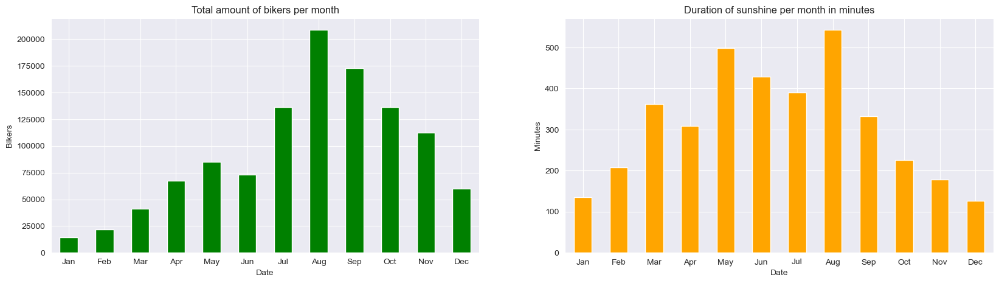

In [90]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8,4))  # 1 row, 2 columns
dg['Total bikers'].plot.bar(rot=0, color="green", figsize=(20,5), ax=ax1)
dg['Duration of sunshine'].plot.bar(rot=1, color="orange", figsize=(20,5), ax=ax2)
ax1.set_ylabel("Bikers")
ax2.set_ylabel("Minutes")
ax1.set_title('Total amount of bikers per month')
ax2.set_title('Duration of sunshine per month in minutes')

Text(0.5, 1.0, 'Duration of sunshine per month in minutes')

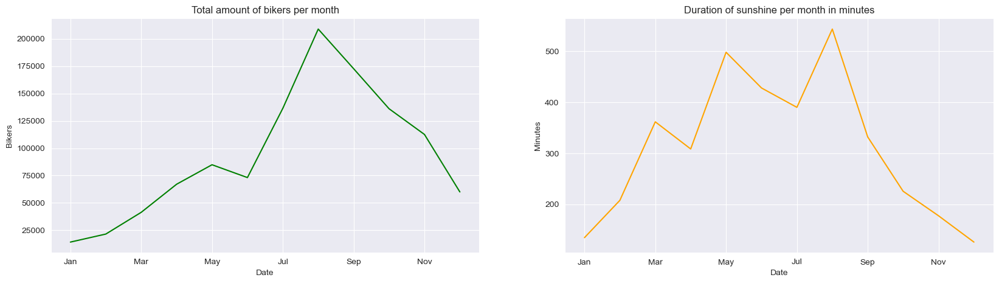

In [91]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8,4))  # 1 row, 2 columns
dg['Total bikers'].plot(rot=0, color="green", figsize=(20,5), ax=ax1)
dg['Duration of sunshine'].plot(rot=1, color="orange", figsize=(20,5), ax=ax2)
ax1.set_ylabel("Bikers")
ax2.set_ylabel("Minutes")
ax1.set_title('Total amount of bikers per month')
ax2.set_title('Duration of sunshine per month in minutes')

#### Snow level and the amount of Bikers

##### Grouping the Snow level
Here the same procedure for the snow level, Therefore ranges of each 20 mm between 0 mm and 200 mm get created. 
then the amount of bikers and the amount of days to each range get calculated:

In [97]:
d_snow = d.groupby(pd.cut(merged_df["Snow-level"], np.arange(0.0, 200.0, 20.0),include_lowest=True)).sum(numeric_only=True)
d_days_snow = d.groupby(pd.cut(merged_df["Snow-level"], np.arange(0.0, 200.0, 20.0),include_lowest=True)).count()
d_snow[["Total bikers"]].join(d_days_snow[["Date"]])

,Total bikers,Date
Snow-level,,
"(-0.001, 20.0]",1085271.0,323
"(20.0, 40.0]",9752.0,14
"(40.0, 60.0]",6026.0,8
"(60.0, 80.0]",5969.0,5
"(80.0, 100.0]",2026.0,3
"(100.0, 120.0]",4002.0,3
"(120.0, 140.0]",6507.0,2
"(140.0, 160.0]",7848.0,4
"(160.0, 180.0]",830.0,1


##### The following plot shows the average amount of bikers per day for different levels of snow

In [ ]:
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i, y[i]/2, str(y[i]), ha = 'center')

x = ["0 to 20", "20 to 40", "40 to 60", "60 to 80","80 to 100", "100 to 120", "120 to 140", "140 to 160", "160 to 180"]
y = list((d_snow["Total bikers"] / d_days_snow["Date"]).astype(int))
plt.figure(figsize=(22,7))
plt.bar(x, y, label="Average bikers per day in duration of Snow level range", color='teal', linewidth = 3)
plt.xlabel("Snow level range",fontsize=12)
plt.ylabel("Bikers",fontsize=12)
plt.legend()
addlabels(x, y)

##### Comparison of the months
To further undermine the assumption a comparison of the month is created in the following

Text(0.5, 1.0, 'Duration of Snow level per month')

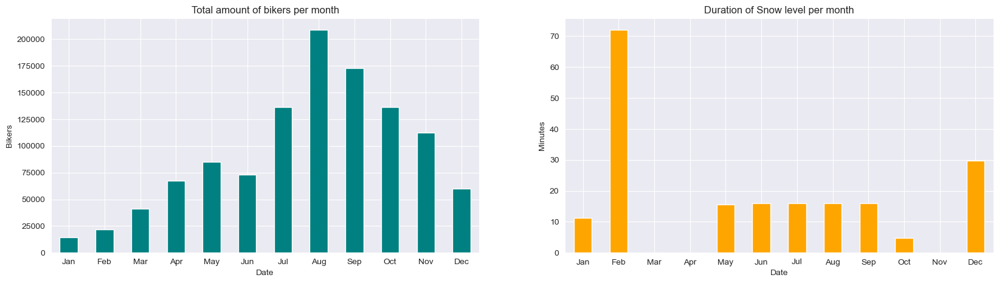

In [98]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8,4))  # 1 row, 2 columns
dg['Total bikers'].plot.bar(rot=0, color="teal", figsize=(20,5), ax=ax1)
dg['Snow-level'].plot.bar(rot=1, color="orange", figsize=(20,5), ax=ax2)
ax1.set_ylabel("Bikers")
ax2.set_ylabel("Minutes")
ax1.set_title('Total amount of bikers per month')
ax2.set_title('Duration of Snow level per month')

Text(0.5, 1.0, 'Duration of Snow level per month')

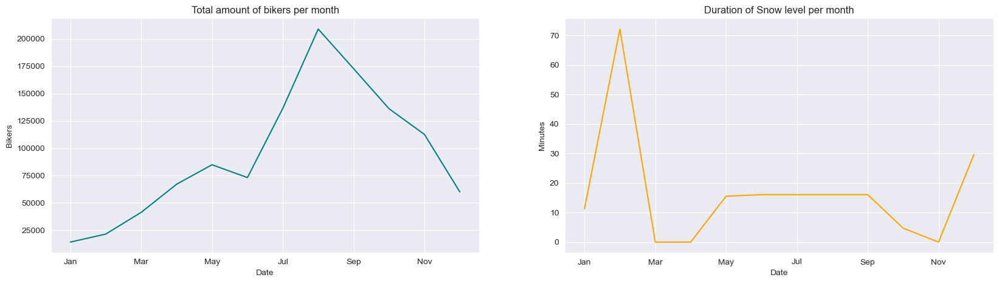

In [99]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(8,4))
dg['Total bikers'].plot(rot=0, color="teal", figsize=(20,5), ax=ax1)
dg['Snow-level'].plot(rot=1, color="orange", figsize=(20,5), ax=ax2)
ax1.set_ylabel("Bikers")
ax2.set_ylabel("Minutes")
ax1.set_title('Total amount of bikers per month')
ax2.set_title('Duration of Snow level per month')

##### There are some parallels between the two plotted bar charts. Especially in colder month.

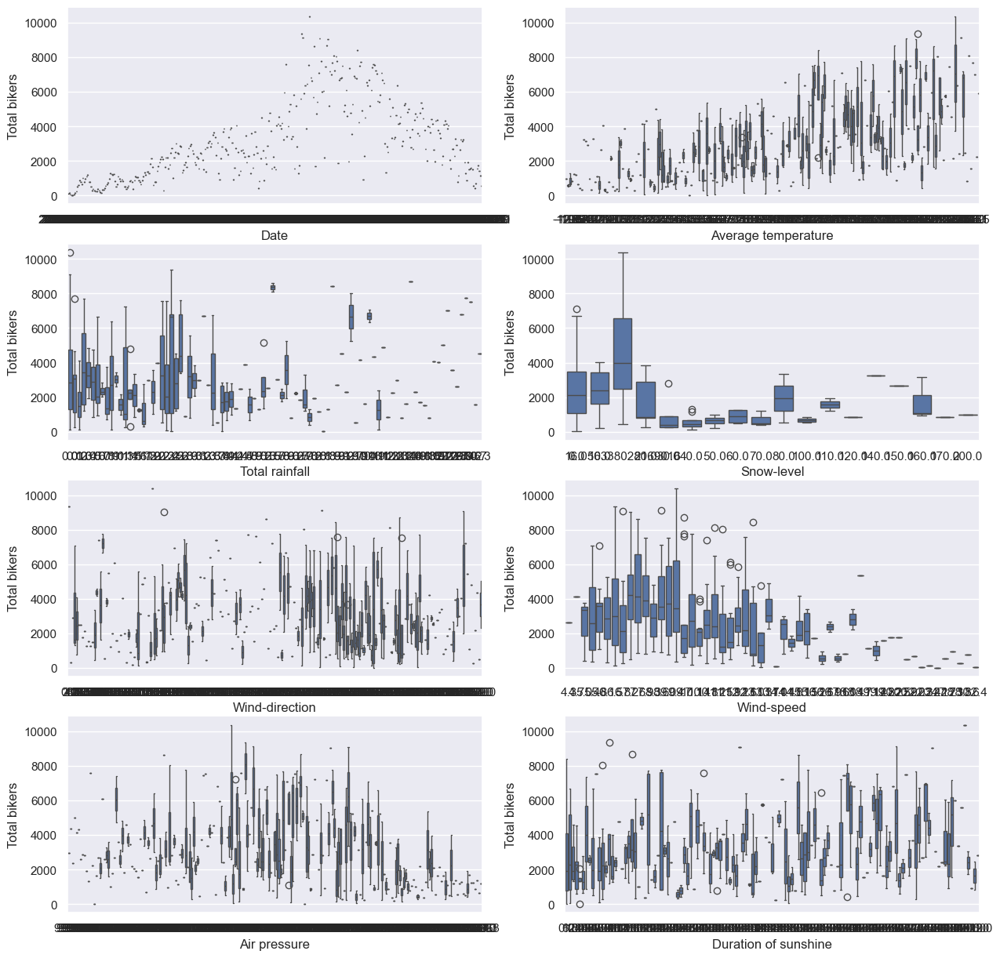

In [100]:
bike_cat_col = ['Date','Average temperature','Total rainfall','Snow-level','Wind-direction','Wind-speed','Air pressure','Duration of sunshine']
plt.figure(figsize=(15, 15))
sns.set(style="darkgrid")
i=1
for col in bike_cat_col:
    plt.subplot(4,2,i)
    sns.boxplot(data=merged_df, x=col, y='Total bikers')
    i=i+1
plt.show()

#### Multivariate Analysis

In [96]:
ff.create_scatterplotmatrix(merged_df[['Min temperature', 'Max temperature', 'Total rainfall', 'Wind-speed','Total bikers']],
                            diag='box', 
                            size=4,
                            height=1300, 
                            width=1380
                           )

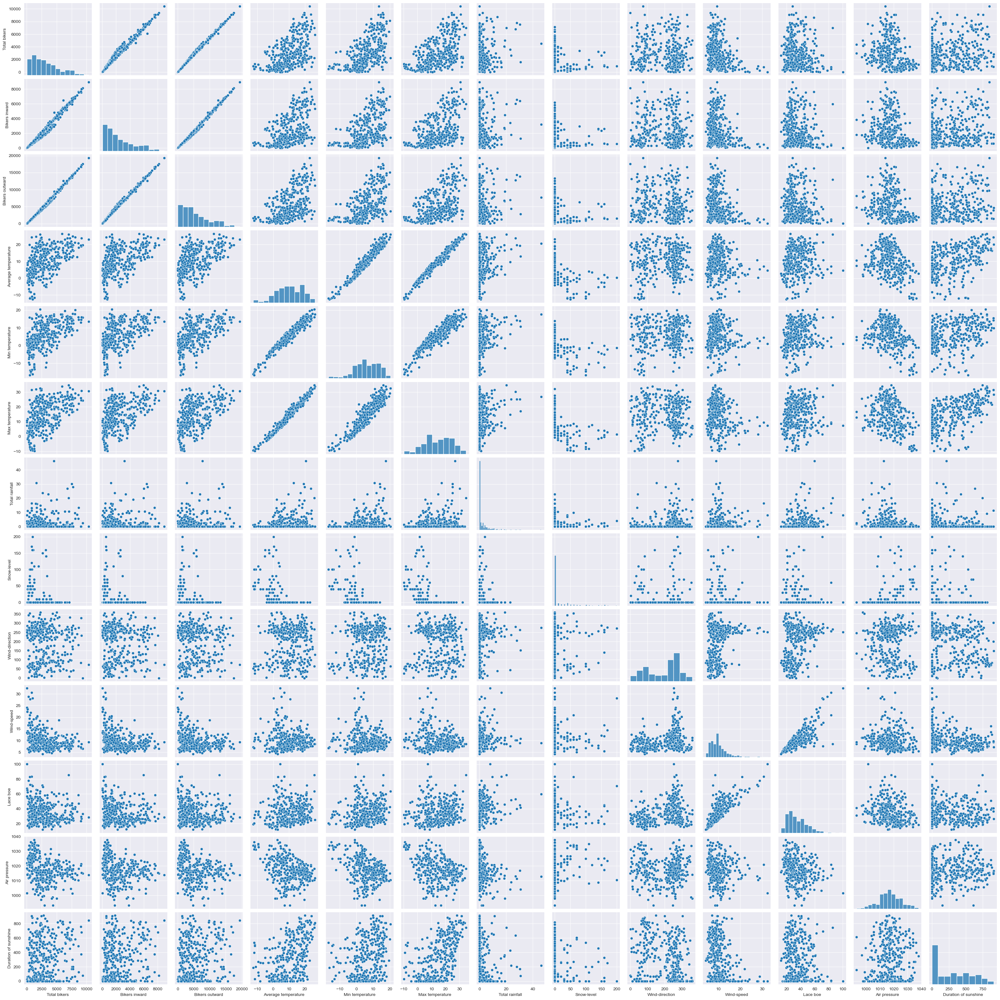

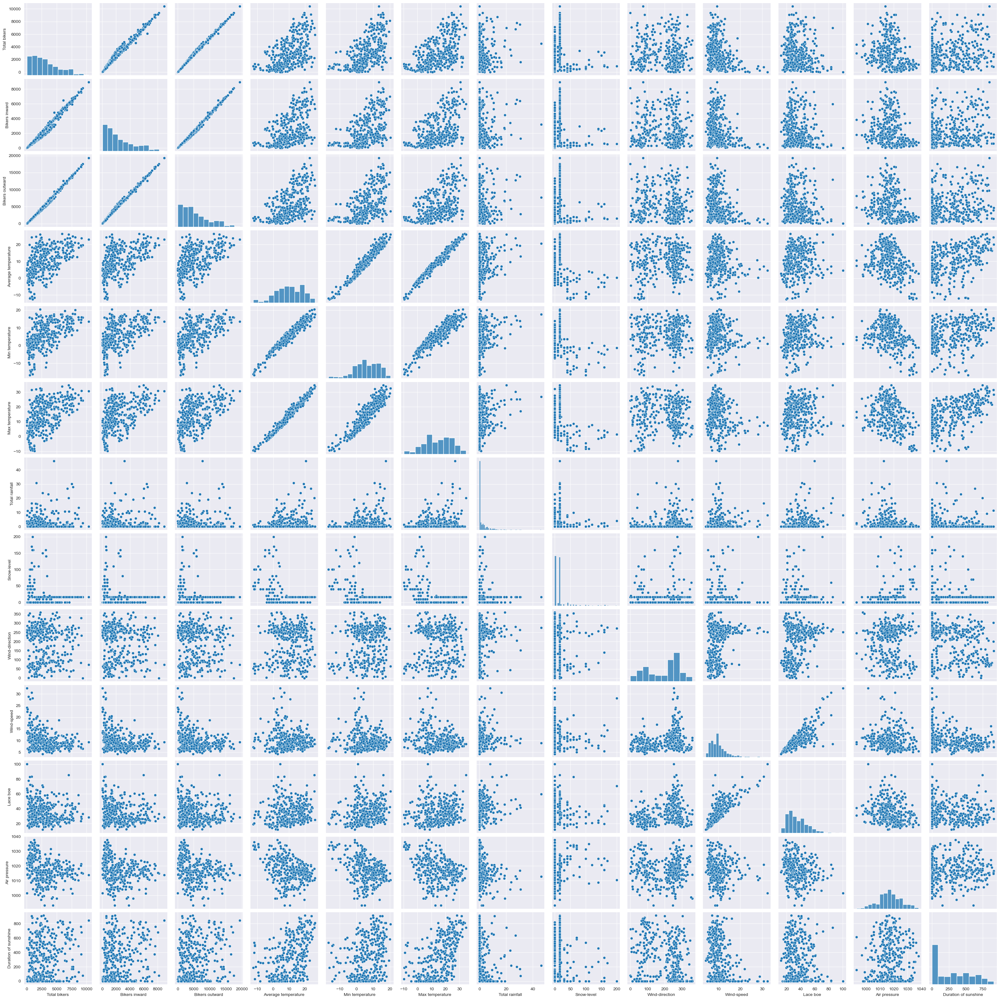

In [93]:
sns.pairplot(merged_df)
plt.show()

<Figure size 3000x4000 with 0 Axes>

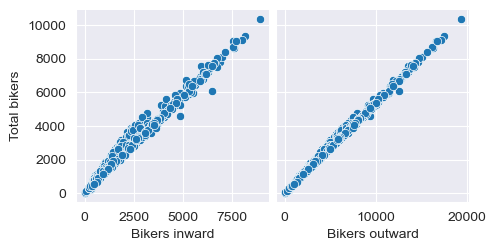

In [94]:
plt.figure(figsize=(30,40))
sns.pairplot(merged_df,x_vars=("Bikers inward","Bikers outward"),y_vars="Total bikers")
plt.show()

In [95]:
 fig=px.bar(merged_df.corr().loc['Total bikers',:].apply(lambda x: abs(x)).sort_values(ascending=False),
       title='Feature importance by Correlation Coefficient',
       color = merged_df.corr().loc['Total bikers',:].apply(lambda x: abs(x)).sort_values(ascending=False),
       text = merged_df.corr().loc['Total bikers',:].apply(lambda x: abs(x)).sort_values(ascending=False).round(2)
      ) 
fig.update_traces(textposition='outside')
fig.show()

## 3. Conclusion

The analysis of the datasets revealed several insights into the factors influencing the number of bikers. Here are the key findings:

### 3.1 Temperature and Biking Activity

There is a clear positive correlation between temperature and the number of bikers.
Warmer temperatures generally lead to an increase in biking activity.

### 3.2 Rainfall and Biking Activity

Contrary to expectations, there is no significant correlation between precipitation and the number of bikers.
Biking activity seems to persist even in rainy conditions.

### 3.3 Multivariate Relationships

Multivariate analysis did not reveal strong correlations between biking activity and other weather-related factors such as wind speed.

## 4. Findings:

### 4.1 Temperature Influence

Biking activity is highly influenced by temperature, with a noticeable increase in warmer conditions.
The average amount of bikers per day rises as temperatures increase.

### 4.2 Rainfall Impact

Surprisingly, rainfall does not exhibit a clear relationship with the number of bikers.
Cyclists are still active even on rainy days, challenging the assumption that precipitation negatively affects biking.

### 4.3 Multivariate Complexity

Exploring multiple factors like minimum temperature, maximum temperature, rainfall, wind speed, and total bikers revealed no strong interdependence.

## 5. Outlook

### 5.1. Further Analysis

Explore additional variables that might influence biking patterns, such as public events, holidays, or special promotions.

### 5.2 Temporal Patterns

Analyze temporal patterns, including daily and hourly trends, to uncover specific time periods of increased biking activity.

## 6. Problem

### 6.1 Inconsistency in Precipitation Impact

- The lack of a consistent correlation between precipitation and biking activity raises questions about the specific conditions under which cyclists choose to ride despite adverse weather.

In summary, while temperature demonstrates a clear impact on biking activity, further investigation is needed to understand the nuanced relationship between precipitation and biking patterns. The findings provide a foundation for refining assumptions and conducting more detailed analyses to enhance our understanding of biking behavior in different weather conditions.
